# **Importing Required Classes from SH17 Safety Equipment Dataset**

Classes Utilized - 'Glasses', 
'Face_mask_medical',
'Face_guard',
'Earmuffs',
'Gloves',
'Shoes',
'Safety_vest',
'Helmet',
'Medical_suit',
'Safety_suit'


In [61]:
import os
import shutil

# Define paths
dataset_dir = "/kaggle/input/sh17-dataset-for-ppe-detection/images"  # Path to the downloaded SH17 dataset
annotations_dir = "/kaggle/input/sh17-dataset-for-ppe-detection/labels"  # Path to the directory containing annotation .txt files
output_dir = "./filtered_sh17_dataset_use"  # Output directory for the filtered dataset

# Define the desired class IDs as strings
desired_classes_sh17 = ["4", "5", "6", "8", "10", "12", "13", "15", "16"]

# Maximum number of images per class
max_images_per_class = 50

# Create output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

# Initialize dictionaries to keep track of images with desired classes and counts
class_image_count = {cls: 0 for cls in desired_classes_sh17}
annotated_images = set()

# Process each annotation file
for filename in os.listdir(annotations_dir):
    if filename.endswith('.txt'):
        # Get the corresponding image name (assuming the image name matches the txt file name)
        image_name = filename[:-4] + '.jpeg'  # Using .jpeg for image format
        image_path = os.path.join(dataset_dir, image_name)

        if not os.path.exists(image_path):
            #print(f"Warning: {image_name} not found in dataset directory.")
            continue

        # Read the annotation file
        with open(os.path.join(annotations_dir, filename), 'r') as file:
            for line in file:
                parts = line.strip().split()
                if len(parts) < 5:
                    #print(f"Malformed line in {filename}: {line.strip()}")
                    continue  # Skip malformed lines

                class_id = parts[0]  # The first part is the class ID as a string

                # Check if this class ID is in our desired classes
                if class_id in desired_classes_sh17:
                    # Check if the class has reached the max limit
                    if class_image_count[class_id] < max_images_per_class:
                        annotated_images.add(image_name)
                        class_image_count[class_id] += 1
                       # print(f"Annotated image found: {image_name} with class {class_id}")
                    else:
                      #  print(f"Class {class_id} has reached the maximum limit of {max_images_per_class} images.")
                        break  # No need to check further annotations for this image

# Copy the annotated images to the output directory
for image_name in annotated_images:
    image_src = os.path.join(dataset_dir, image_name)
    if os.path.exists(image_src):
        shutil.copy(image_src, output_dir)
      #  print(f"Copied: {image_name}")

print(f"Filtered dataset created with {len(annotated_images)} annotated images.")


Filtered dataset created with 190 annotated images.


In [126]:
import os
import shutil

# Define paths
annotations_dir = "/kaggle/input/sh17-dataset-for-ppe-detection/labels"  # Path to the directory containing annotation .txt files
filtered_images_dir = "./filtered_sh17_dataset_use"  # Path to the directory where filtered images are saved
output_labels_dir = "./filtered_sh17_dataset_labels"  # Output directory for the filtered annotations

# Create output directory for labels if it doesn't exist
os.makedirs(output_labels_dir, exist_ok=True)

# Get the list of annotated images from the filtered dataset
filtered_image_names = set(os.listdir(filtered_images_dir))

# Iterate through the annotation files and copy those that match the filtered images
for filename in os.listdir(annotations_dir):
    if filename.endswith('.txt'):
        # Get the corresponding image name (assuming the image name matches the txt file name)
        image_name = filename[:-4] + '.jpeg'  # Using .jpeg for image format
        
        # Check if the image is in the filtered set
        if image_name in filtered_image_names:
            # Copy the corresponding annotation file to the output directory
            annotation_src = os.path.join(annotations_dir, filename)
            annotation_dst = os.path.join(output_labels_dir, filename)
            shutil.copy(annotation_src, annotation_dst)
            # print(f"Copied annotation: {filename}")

print(f"Filtered annotations created with {len(os.listdir(output_labels_dir))} annotation files.")


Filtered annotations created with 190 annotation files.


In [62]:
print("Final count of images for each class:")
for class_id, count in class_image_count.items():
    print(f"Class {class_id}: {count} images")

Final count of images for each class:
Class 4: 30 images
Class 5: 50 images
Class 6: 50 images
Class 8: 50 images
Class 10: 50 images
Class 12: 50 images
Class 13: 11 images
Class 15: 18 images
Class 16: 50 images


# **# Printing 5 random annotated images downloaded from SH17**

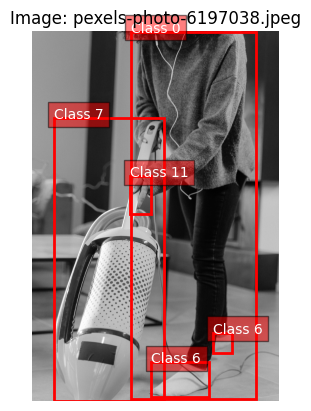

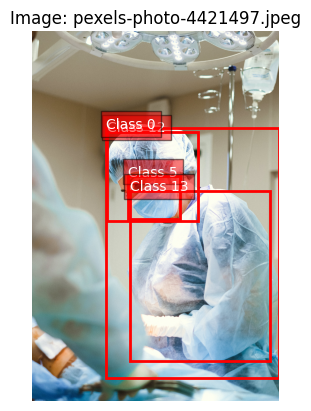

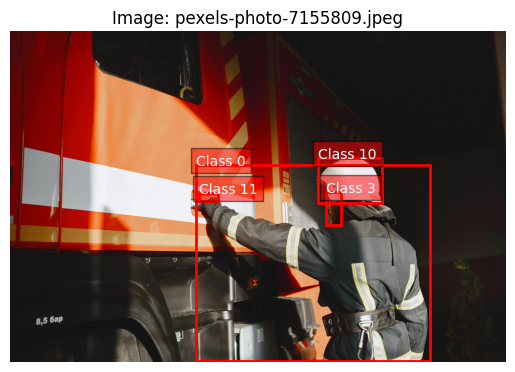

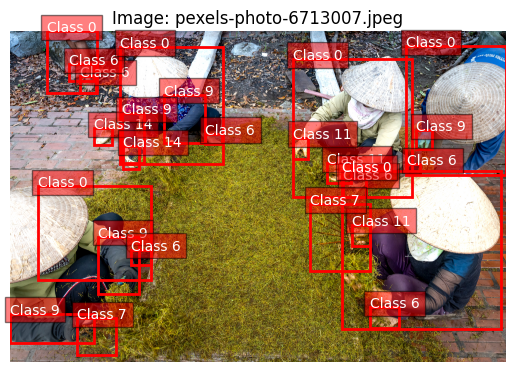

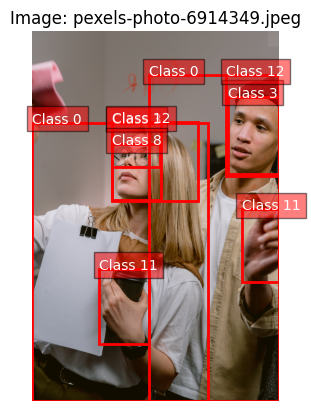

In [63]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def visualize_images_with_annotations(output_dir, annotations_dir, num_images=5):
    # Get the list of filtered images
    filtered_images = [f for f in os.listdir(output_dir) if f.lower().endswith('.jpeg') or f.lower().endswith('.jpg')]
    
    # Randomly sample images to visualize
    sampled_images = random.sample(filtered_images, min(num_images, len(filtered_images)))

    for image_name in sampled_images:
        image_path = os.path.join(output_dir, image_name)
        annotation_path = os.path.join(annotations_dir, image_name[:-5] + '.txt')  # Assuming .jpeg extension

        # Load the image
        try:
            img = Image.open(image_path)
            img.load()  # Load image data to check if it's valid
        except Exception as e:
            print(f"Error loading image {image_path}: {e}")
            continue

        # Create a new figure
        fig, ax = plt.subplots(1)
        ax.imshow(img)
        ax.axis('off')  # Hide axis

        # Read and draw the annotations if the annotation file exists
        if os.path.exists(annotation_path):
            with open(annotation_path, 'r') as file:
                for line in file:
                    parts = line.strip().split()
                    if len(parts) < 5:
                        print(f"Warning: Skipping malformed annotation line in {annotation_path}: {line.strip()}")
                        continue  # Skip malformed lines

                    class_id = parts[0]
                    x_center = float(parts[1]) * img.width
                    y_center = float(parts[2]) * img.height
                    width = float(parts[3]) * img.width
                    height = float(parts[4]) * img.height

                    # Calculate rectangle coordinates
                    x0 = x_center - width / 2
                    y0 = y_center - height / 2

                    # Create a Rectangle patch
                    rect = patches.Rectangle((x0, y0), width, height, linewidth=2, edgecolor='r', facecolor='none')
                    ax.add_patch(rect)
                    ax.text(x0, y0, f'Class {class_id}', color='white', fontsize=10, bbox=dict(facecolor='red', alpha=0.5))

        plt.title(f"Image: {image_name}")
        plt.show()

# Call the updated visualization function
visualize_images_with_annotations(output_dir, annotations_dir, num_images=5)


# **Getting Images from COCO dataset**

Classes Utilized - 
'Person',
'Bicycle',
'Car',
'Motorcycle',
'Bus',
'Traffic Light',
'Backpack',
'Umbrella',
'Suitcase'

In [64]:
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T
from torchvision.datasets import CocoDetection
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os

In [65]:
!pip install pycocotools

In [66]:
import os
import requests
import zipfile

def download_and_unzip(url, extract_to='.'):
    local_filename = url.split('/')[-1]
    # Download the file
    with requests.get(url, stream=True) as r:
        r.raise_for_status()
        with open(local_filename, 'wb') as f:
            for chunk in r.iter_content(chunk_size=8192): 
                f.write(chunk)
    # Unzip the file
    with zipfile.ZipFile(local_filename, 'r') as zip_ref:
        zip_ref.extractall(extract_to)
    print(f"Downloaded and extracted {local_filename}.")

# Download the COCO 2017 train/val annotations
download_and_unzip('http://images.cocodataset.org/annotations/annotations_trainval2017.zip', './coco')


Downloaded and extracted annotations_trainval2017.zip.


In [67]:
import os
import requests
import json
import shutil

# Remove existing directories if they exist
shutil.rmtree('./coco/yolo_train', ignore_errors=True)
shutil.rmtree('./qa', ignore_errors=True)

# Define the categories to keep (COCO category IDs)
categories_to_keep = [1, 2, 3, 4, 8, 10, 62, 77, 11]
num_images_per_class = 100  # Limit the number of images per class

# Define the output directories
images_output_dir = 'images'  # Directory for images
annotations_output_dir = 'annotations'  # Directory for YOLO-compatible annotations

# Create the output directories
os.makedirs(images_output_dir, exist_ok=True)
os.makedirs(annotations_output_dir, exist_ok=True)

# Load COCO annotations
ann_file = '/kaggle/working/coco/annotations/instances_train2017.json'  # Update to your annotation file path
with open(ann_file) as f:
    coco_data = json.load(f)

# Define a custom mapping of COCO category IDs to specified YOLO class IDs
category_id_to_yolo_class = {
    1: 1,
    2: 2,
    3: 3,
    4: 7,
    8: 9,
    10: 11,
    62: 14,
    77: 17,
    11: 18
}

# Initialize a dictionary to count downloaded images per category
count_per_class = {cat_id: 0 for cat_id in categories_to_keep}

# Download images and save annotations
for img_info in coco_data['images']:
    img_id = img_info['id']
    img_filename = img_info['file_name']
    
    # Get the category IDs for the current image
    ann_ids = [ann['category_id'] for ann in coco_data['annotations'] if ann['image_id'] == img_id]
    
    # Filter for relevant category IDs
    relevant_ann_ids = [cat_id for cat_id in ann_ids if cat_id in categories_to_keep]

    # Only download if there are relevant annotations and limit reached
    if relevant_ann_ids:
        # Construct the image URL
        img_url = f"http://images.cocodataset.org/train2017/{img_filename}"
        response = requests.get(img_url)

        if response.status_code == 200:
            # Save the image
            img_path = os.path.join(images_output_dir, img_filename)
            with open(img_path, 'wb') as img_file:
                img_file.write(response.content)

            # Prepare to save annotations
            yolo_annotations = []
            for cat_id in relevant_ann_ids:
                # Get the bounding boxes for the current image
                for ann in coco_data['annotations']:
                    if ann['image_id'] == img_id and ann['category_id'] == cat_id:
                        # Convert COCO bbox format [x, y, width, height] to YOLO format [x_center, y_center, width, height]
                        x, y, width, height = ann['bbox']
                        x_center = (x + width / 2) / img_info['width']
                        y_center = (y + height / 2) / img_info['height']
                        width /= img_info['width']
                        height /= img_info['height']
                        yolo_annotations.append(f"{category_id_to_yolo_class[cat_id]} {x_center} {y_center} {width} {height}")

            # Save the annotations in a .txt file
            annotation_file_path = os.path.join(annotations_output_dir, f"{img_filename.replace('.jpg', '.txt')}")
            with open(annotation_file_path, 'w') as ann_file:
                for line in yolo_annotations:
                    ann_file.write(line + '\n')

            # Increment the count for each category based on the first relevant annotation
            for cat_id in relevant_ann_ids:
                if count_per_class[cat_id] < num_images_per_class:
                    count_per_class[cat_id] += 1

        else:
            print(f"Failed to download {img_url}")

    # Break the loop if all categories have reached their limits
    if all(count >= num_images_per_class for count in count_per_class.values()):
        break

print("Download completed.")


KeyboardInterrupt: 

In [109]:
# After the image download loop finishes, print the number of images per class
print("Number of images downloaded per class:")
for cat_id, count in count_per_class.items():
    print(f"Class {cat_id}: {count} images")


Number of images downloaded per class:
Class 1: 100 images
Class 2: 99 images
Class 3: 100 images
Class 4: 100 images
Class 8: 100 images
Class 10: 100 images
Class 62: 100 images
Class 77: 92 images
Class 11: 34 images


# **Printing Random downloaded Images from COCO**

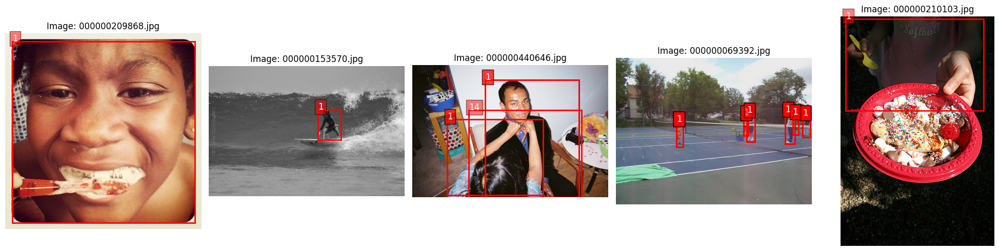

In [68]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os
import random

def visualize_random_images_with_boxes(images_output_dir, annotations_output_dir, categories_to_keep, num_images=5):
    # Get a list of all image files in the images output directory
    image_files = [f for f in os.listdir(images_output_dir) if f.endswith('.jpg')]
    
    # Randomly select 'num_images' image files
    selected_images = random.sample(image_files, min(num_images, len(image_files)))

    # Create a figure for plotting
    fig, axes = plt.subplots(1, num_images, figsize=(20, 5))  # Adjust the figure size as needed

    # Iterate through each selected image
    for ax, img_filename in zip(axes, selected_images):
        img_path = os.path.join(images_output_dir, img_filename)

        # Load the image
        img = plt.imread(img_path)
        ax.imshow(img)

        # Load the corresponding YOLO annotation file
        annotation_file_path = os.path.join(annotations_output_dir, f"{img_filename.replace('.jpg', '.txt')}")
        if os.path.exists(annotation_file_path):
            with open(annotation_file_path, 'r') as ann_file:
                for line in ann_file:
                    # Each line contains class_id x_center y_center width height
                    data = line.strip().split()
                    if len(data) == 5:
                        category_id = int(data[0])
                        x_center, y_center, width, height = map(float, data[1:])

                        # Convert YOLO format to bounding box format for visualization
                        img_width, img_height = img.shape[1], img.shape[0]
                        x = (x_center - width / 2) * img_width
                        y = (y_center - height / 2) * img_height
                        rect = patches.Rectangle((x, y), width * img_width, height * img_height,
                                                 linewidth=2, edgecolor='r', facecolor='none')
                        ax.add_patch(rect)

                        # Add a label for the category
                        ax.text(x, y, str(category_id), color='white',
                                fontsize=12, bbox=dict(facecolor='red', alpha=0.5))

        ax.axis('off')
        ax.set_title(f'Image: {img_filename}')

    plt.tight_layout()
    plt.show()

# Call the visualization function with the updated parameters
images_output_dir = '/kaggle/working/images'  # Path to images directory
annotations_output_dir = './annotations'  # Path to annotations directory
categories_to_keep = [1, 2, 3, 4, 8, 10, 62, 77, 11]  # Update this if needed

visualize_random_images_with_boxes(images_output_dir, annotations_output_dir, categories_to_keep, num_images=5)


# **Retreiving Data from Open Images Data Set**

Classes Utilized -
    "Axe", "Backpack", "Binoculars", "Beaker", "Flashlight",
    "Hammer", "Handgun", "Ladder", "Knife", "Light bulb",
    "Light switch", "Printer", "Ruler", "Screwdriver",
    "Shelf", "Stapler", "Stretcher", "Syringe", "Torch",
    "Wheel", "Wheelchair", "Wrench", "Spatula", "Stairs"


In [43]:
# Install the FiftyOne library
!pip install fiftyone


In [39]:
import fiftyone as fo
import fiftyone.zoo as foz
import os
import shutil
import random
import matplotlib.pyplot as plt
import cv2  # Import OpenCV
import numpy as np  # Import NumPy
from PIL import Image

In [20]:
!wget https://storage.googleapis.com/openimages/2018_04/train/train-annotations-bbox.csv

--2024-11-20 07:24:41--  https://storage.googleapis.com/openimages/2018_04/train/train-annotations-bbox.csv
Resolving storage.googleapis.com (storage.googleapis.com)... 209.85.145.207, 142.251.183.207, 74.125.202.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|209.85.145.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1194033454 (1.1G) [text/csv]
Saving to: 'train-annotations-bbox.csv.1'

train-annotations-b 100%[===================>]   1.11G   235MB/s    in 4.8s    

2024-11-20 07:24:46 (236 MB/s) - 'train-annotations-bbox.csv.1' saved [1194033454/1194033454]



In [21]:
!wget https://storage.googleapis.com/openimages/2018_04/class-descriptions-boxable.csv

--2024-11-20 07:24:54--  https://storage.googleapis.com/openimages/2018_04/class-descriptions-boxable.csv
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.132.207, 142.251.184.207, 74.125.69.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.132.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 11255 (11K) [text/csv]
Saving to: 'class-descriptions-boxable.csv.1'

class-descriptions- 100%[===================>]  10.99K  --.-KB/s    in 0s      

2024-11-20 07:24:54 (50.7 MB/s) - 'class-descriptions-boxable.csv.1' saved [11255/11255]



In [106]:
##NEWWW

import fiftyone as fo
import os
import shutil
from PIL import Image

# Define the desired classes from your list
desired_classes = [
    "Axe", "Backpack", "Binoculars", "Beaker", "Flashlight", "Hammer", "Handgun", 
    "Ladder", "Knife", "Light bulb", "Light switch", "Printer", "Ruler", "Screwdriver", 
    "Shelf", "Stretcher", "Syringe", "Torch", "Wheel", "Wheelchair", "Wrench", "Spatula", "Stairs"
]

# Create directories to store the images and annotations, delete them if they exist
images_dir = './processed_images'
annotations_dir = './processed_annotations'

# Delete existing directories if they exist
if os.path.exists(images_dir):
    shutil.rmtree(images_dir)
if os.path.exists(annotations_dir):
    shutil.rmtree(annotations_dir)

# Recreate the directories
os.makedirs(images_dir, exist_ok=True)
os.makedirs(annotations_dir, exist_ok=True)

# Load the dataset (update this path to your specific FiftyOne dataset directory if needed)
dataset = fo.load_dataset("open-images-v6-train-2400")

# Filter the samples based on desired classes and limit each class to 50 images
limited_samples = []
class_counts = {cls: 0 for cls in desired_classes}

for sample in dataset:
    for detection in sample.ground_truth.detections:
        if detection.label in desired_classes:
            if class_counts[detection.label] < 100:  # Limit to 50 images per class
                limited_samples.append(sample)
                class_counts[detection.label] += 1
                if all(count >= 50 for count in class_counts.values()):
                    break

# Save the images and annotations
for sample in limited_samples:
    # Get the source image file path
    image_path = sample.filepath
    # Define the destination path for the image
    destination_image_path = os.path.join(images_dir, f"{sample.id}.jpg")
    
    # Copy the image to the destination directory
    shutil.copy(image_path, destination_image_path)

    # Open the image using PIL to get its dimensions
    with Image.open(image_path) as img:
        img_width, img_height = img.size

    # Create the YOLO annotations file
    yolo_annotation_path = os.path.join(annotations_dir, f"{sample.id}.txt")
    
    # Open the annotation file for writing
    with open(yolo_annotation_path, 'w') as annot_file:
        written_annotations = 0  # Keep track of how many annotations are written

        for detection in sample.ground_truth.detections:
            if detection.label in desired_classes:
                # Get bounding box info and convert to YOLO format (normalized coordinates)
                x_min, y_min, x_max, y_max = detection.bounding_box
                
                # Ensure the bounding box values are within the image dimensions
                if x_min < 0 or y_min < 0 or x_max > img_width or y_max > img_height:
                    continue  # Skip invalid bounding boxes

                # Calculate width and height of the bounding box
                width = abs(x_max - x_min)  # Ensure positive width
                height = abs(y_max - y_min)  # Ensure positive height

                # Skip invalid bounding boxes (zero width or height)
                if width <= 0 or height <= 0:
                    continue

                # Normalize coordinates to range [0, 1]
                x_center = (x_min + x_max) / 2 / img_width
                y_center = (y_min + y_max) / 2 / img_height
                width = width / img_width
                height = height / img_height

                # Skip annotations where width or height is extremely small
                if width < 1e-4 or height < 1e-4:  # Relax the filter slightly if necessary
                    continue

                # Ensure values are within [0, 1]
                x_center = max(0, min(1, x_center))
                y_center = max(0, min(1, y_center))
                width = max(0, min(1, width))
                height = max(0, min(1, height))

                # Get the new class ID starting from 19
                class_id = desired_classes.index(detection.label) + 19  # Re-number classes from 19 onwards

                # Write YOLO annotation: class_id, x_center, y_center, width, height
                annot_file.write(f"{class_id} {x_center} {y_center} {width} {height}\n")
                written_annotations += 1

        # If no valid detections for this sample, remove the annotation file
        if written_annotations == 0:
            os.remove(yolo_annotation_path)

print("Finished processing and saving images and annotations.")


Finished processing and saving images and annotations.


In [159]:
import shutil
from PIL import Image

# Initialize class_counts to track the number of images per class after processing
class_counts_after = {cls: 0 for cls in range(19, 19 + len(desired_classes))}  # Class IDs starting from 19

# Process the images and annotations as before
for sample in limited_samples:
    # Get the source image file path
    image_path = sample.filepath
    # Define the destination path for the image
    destination_image_path = os.path.join(images_dir, f"{sample.id}.jpg")
    
    # Copy the image to the destination directory
    shutil.copy(image_path, destination_image_path)

    # Open the image using PIL to get its dimensions
    with Image.open(image_path) as img:
        img_width, img_height = img.size

    # Create the YOLO annotations file
    yolo_annotation_path = os.path.join(annotations_dir, f"{sample.id}.txt")
    
    # Open the annotation file for writing
    with open(yolo_annotation_path, 'w') as annot_file:
        # Flag to check if we have any valid detections
        has_valid_detection = False
        written_annotations = 0  # Keep track of how many annotations are written

        for detection in sample.ground_truth.detections:
            if detection.label in desired_classes:
                # Get bounding box info and convert to YOLO format (normalized coordinates)
                x_min, y_min, x_max, y_max = detection.bounding_box
                
                # Ensure the bounding box values are within the image dimensions
                if x_min < 0 or y_min < 0 or x_max > img_width or y_max > img_height:
                    continue  # Skip invalid bounding boxes

                # Calculate width and height of the bounding box
                width = abs(x_max - x_min)
                height = abs(y_max - y_min)

                # Skip invalid bounding boxes (zero width or height)
                if width <= 0 or height <= 0:
                    continue

                # Normalize coordinates to range [0, 1]
                x_center = (x_min + x_max) / 2 / img_width
                y_center = (y_min + y_max) / 2 / img_height
                width = width / img_width
                height = height / img_height

                # Ensure values are within [0, 1]
                x_center = max(0, min(1, x_center))
                y_center = max(0, min(1, y_center))
                width = max(0, min(1, width))
                height = max(0, min(1, height))

                # Get the new class ID starting from 19
                class_id = desired_classes.index(detection.label) + 19  # Re-number classes from 19 onwards

                # Write YOLO annotation: class_id, x_center, y_center, width, height
                annot_file.write(f"{class_id} {x_center} {y_center} {width} {height}\n")
                written_annotations += 1

        # If no valid detections for this sample, remove the annotation file
        if written_annotations == 0:
            os.remove(yolo_annotation_path)

# After processing all the samples, count how many images correspond to each class
for sample in limited_samples:
    for detection in sample.ground_truth.detections:
        if detection.label in desired_classes:
            # Increment the count for the corresponding class ID
            class_id = desired_classes.index(detection.label) + 19  # Re-number classes from 19 onwards
            class_counts_after[class_id] += 1

# Print out the counts of images per class
print("Class counts after processing:")
for class_id, count in class_counts_after.items():
    print(f"Class {class_id}: {count} images")

print("Finished processing and saving images and annotations.")


Class counts after processing:
Class 19: 10 images
Class 20: 485 images
Class 21: 11 images
Class 22: 11 images
Class 23: 10 images
Class 24: 14 images
Class 25: 54 images
Class 26: 81 images
Class 27: 180 images
Class 28: 3654 images
Class 29: 5 images
Class 30: 12 images
Class 31: 23 images
Class 32: 53 images
Class 33: 774 images
Class 34: 14 images
Class 35: 5 images
Class 36: 8 images
Class 37: 578 images
Class 38: 339 images
Class 39: 230 images
Class 40: 36 images
Class 41: 174 images
Finished processing and saving images and annotations.


# **Displaying Random downloaded images from Open Images**

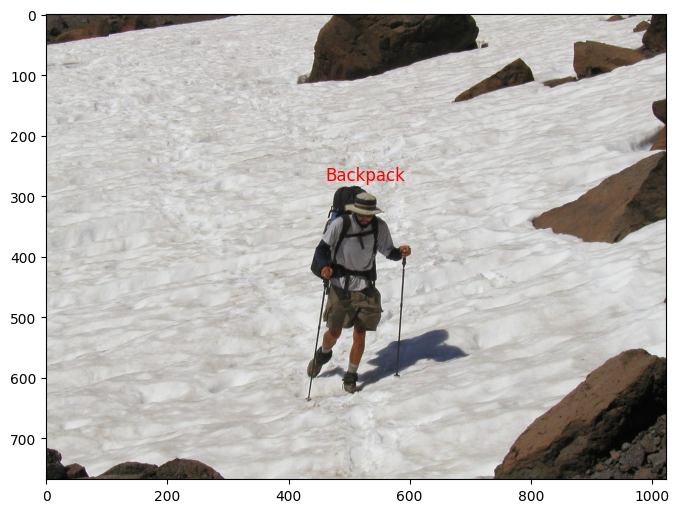

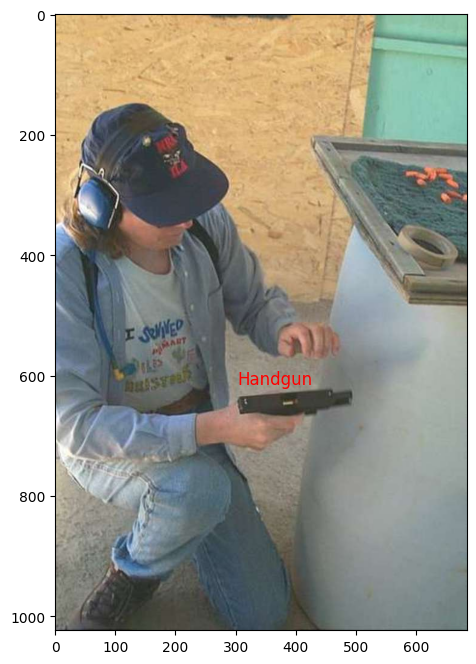

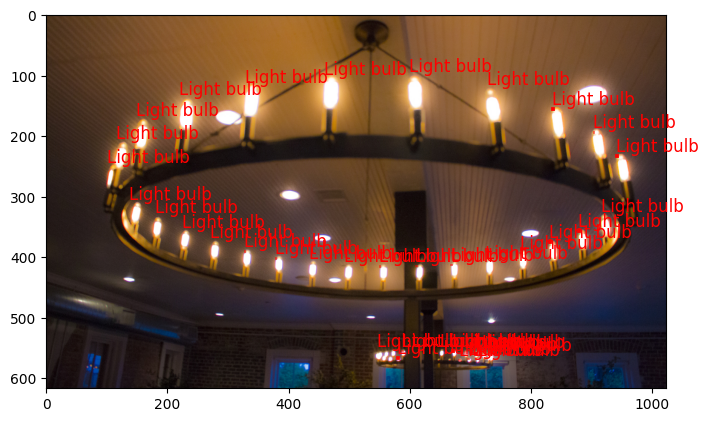

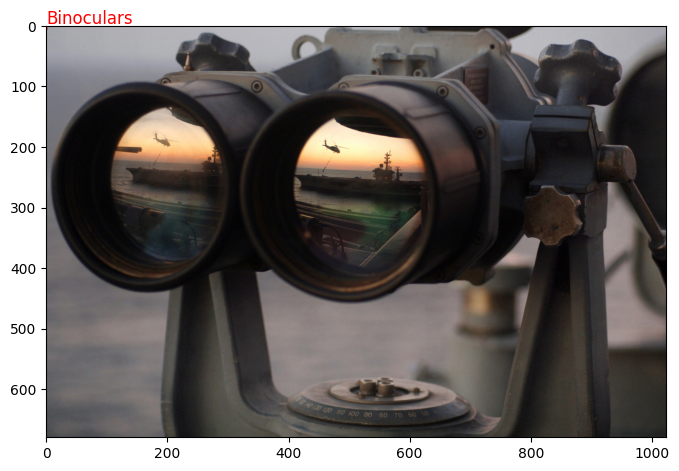

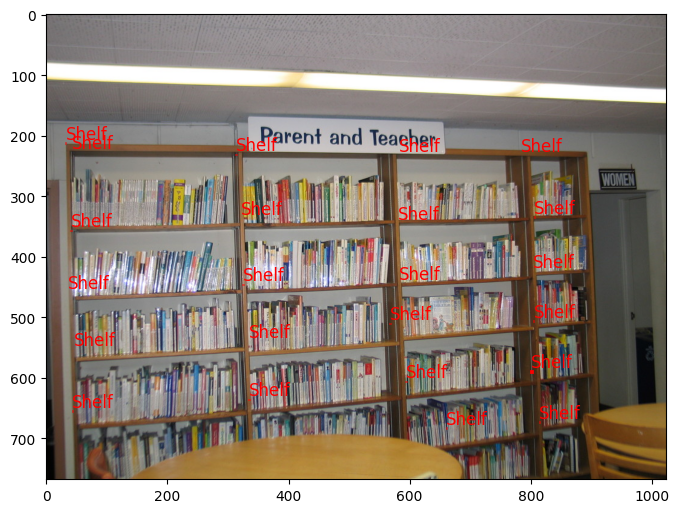

In [108]:
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

# Select 5 random images from the processed images
random_samples = random.sample(limited_samples, 5)

# Display 5 random images along with their bounding boxes
for sample in random_samples:
    image_path = sample.filepath
    with Image.open(image_path) as img:
        fig, ax = plt.subplots(1, figsize=(8, 8))
        ax.imshow(img)

        # Draw bounding boxes on the image
        for detection in sample.ground_truth.detections:
            if detection.label in desired_classes:
                x_min, y_min, x_max, y_max = detection.bounding_box
                width = abs(x_max - x_min)
                height = abs(y_max - y_min)

                # Convert to pixel coordinates
                x_min *= img.width
                y_min *= img.height
                x_max *= img.width
                y_max *= img.height

                # Draw rectangle on the image
                rect = patches.Rectangle((x_min, y_min), width, height, linewidth=2, edgecolor='r', facecolor='none')
                ax.add_patch(rect)

                # Label the bounding box
                ax.text(x_min, y_min, detection.label, color='red', fontsize=12, verticalalignment='bottom', horizontalalignment='left')

        plt.show()


In [111]:
import os
import shutil

# Define the paths to your directories
annotations_dir = '/kaggle/working/images'  # Update this to your annotations directory path
images_dir = '/kaggle/working/annotations'  # Update this to your images directory path

# Create a combined directory if it doesn't exist
combined_dir = '/kaggle/working/coco_data_final'  # Update as needed
os.makedirs(combined_dir, exist_ok=True)

# Copy images to the combined directory
for filename in os.listdir(images_dir):
    src = os.path.join(images_dir, filename)
    dest = os.path.join(combined_dir, filename)
    shutil.copy(src, dest)

# Copy annotation files to the combined directory
for filename in os.listdir(annotations_dir):
    src = os.path.join(annotations_dir, filename)
    dest = os.path.join(combined_dir, filename)  # Ensure the names match
    shutil.copy(src, dest)

print("Contents copied successfully!")


Contents copied successfully!


In [127]:
import os
import shutil

# Define the paths to your directories
annotations_dir = '/kaggle/working/filtered_sh17_dataset_labels'  # Update this to your annotations directory path
images_dir = '/kaggle/working/filtered_sh17_dataset_use'  # Update this to your images directory path

# Create a combined directory if it doesn't exist
combined_dir = '/kaggle/working/sh17_data_final'  # Update as needed
os.makedirs(combined_dir, exist_ok=True)

# Copy images to the combined directory
for filename in os.listdir(images_dir):
    src = os.path.join(images_dir, filename)
    dest = os.path.join(combined_dir, filename)
    shutil.copy(src, dest)

# Copy annotation files to the combined directory
for filename in os.listdir(annotations_dir):
    src = os.path.join(annotations_dir, filename)
    dest = os.path.join(combined_dir, filename)  # Ensure the names match
    shutil.copy(src, dest)

print("Contents copied successfully!")


Contents copied successfully!


In [71]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.4/887.4 kB 15.4 MB/s eta 0:00:0000:01


In [140]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Source directories for images and annotations
source_dirs = [
    {'images': '/kaggle/working/processed_images', 'labels': '/kaggle/working/processed_annotations'},
    {'images': '/kaggle/working/images', 'labels': '/kaggle/working/annotations'},
    {'images': '/kaggle/working/filtered_sh17_dataset_use', 'labels': '/kaggle/working/filtered_sh17_dataset_labels'}
]

# Destination directories for all images and annotations
combined_images_dir = '/kaggle/working/all_images'
combined_labels_dir = '/kaggle/working/all_labels'

# Train/validation directories
train_images_dir = '/kaggle/working/combined_images/train'
val_images_dir = '/kaggle/working/combined_images/val'
train_labels_dir = '/kaggle/working/combined_labels/train'
val_labels_dir = '/kaggle/working/combined_labels/val'

# Create directories if they don't exist
os.makedirs(combined_images_dir, exist_ok=True)
os.makedirs(combined_labels_dir, exist_ok=True)
os.makedirs(train_images_dir, exist_ok=True)
os.makedirs(val_images_dir, exist_ok=True)
os.makedirs(train_labels_dir, exist_ok=True)
os.makedirs(val_labels_dir, exist_ok=True)

# Step 1: Consolidate all images and annotations into combined directories
for source in source_dirs:
    image_files = [f for f in os.listdir(source['images']) if f.endswith('.jpg') or f.endswith('.png')]
    
    for file in image_files:
        # Move image files
        shutil.copy(os.path.join(source['images'], file), os.path.join(combined_images_dir, file))
        
        # Move corresponding label files
        label_file = file.replace('.jpg', '.txt').replace('.png', '.txt')
        if os.path.exists(os.path.join(source['labels'], label_file)):
            shutil.copy(os.path.join(source['labels'], label_file), os.path.join(combined_labels_dir, label_file))

# Step 2: Split the consolidated dataset into train and validation sets
image_files = [f for f in os.listdir(combined_images_dir) if f.endswith('.jpg') or f.endswith('.png')]
train_files, val_files = train_test_split(image_files, test_size=0.2, random_state=42)

# Move images and labels to train and val directories
for file in train_files:
    # Move image
    shutil.move(os.path.join(combined_images_dir, file), os.path.join(train_images_dir, file))
    
    # Move corresponding label if it exists
    label_file = file.replace('.jpg', '.txt').replace('.png', '.txt')
    label_path = os.path.join(combined_labels_dir, label_file)
    if os.path.exists(label_path):
        shutil.move(label_path, os.path.join(train_labels_dir, label_file))

for file in val_files:
    # Move image
    shutil.move(os.path.join(combined_images_dir, file), os.path.join(val_images_dir, file))
    
    # Move corresponding label if it exists
    label_file = file.replace('.jpg', '.txt').replace('.png', '.txt')
    label_path = os.path.join(combined_labels_dir, label_file)
    if os.path.exists(label_path):
        shutil.move(label_path, os.path.join(val_labels_dir, label_file))


In [ ]:
#shutil.rmtree('/kaggle/working/combined_labels_final/')

import os
import shutil

# Define your label directories and the destination directory
labels_dir1 = '/kaggle/working/annotations'
labels_dir2 = '/kaggle/working/processed_annotations'
labels_dir3 = '/kaggle/working/filtered_sh17_dataset_labels'
combined_labels_dir = '/kaggle/working/combined_labels_final2/'

# Create the destination directory if it doesn't exist
os.makedirs(combined_labels_dir, exist_ok=True)

# Function to copy labels from a source directory to the destination directory
def copy_labels(source_dir):
    for label_file in os.listdir(source_dir):
        # Construct full file path
        src = os.path.join(source_dir, label_file)
        dst = os.path.join(combined_labels_dir, label_file)
        # Check if the file already exists in the destination
        if not os.path.exists(dst):
            shutil.copy(src, dst)  # Use shutil.move to move instead of copy
        else:
            print(f"Warning: {label_file} already exists in {combined_labels_dir} and will not be overwritten.")

# Copy labels from all three directories
copy_labels(labels_dir1)
copy_labels(labels_dir2)
copy_labels(labels_dir3)

print("Labels combined successfully!")


In [142]:
import os
import shutil

# Define your directories
train_dir = '/kaggle/working/combined_images/train'
val_dir = '/kaggle/working/combined_labels/val/'
labels_dir = '/kaggle/working/combined_labels_final2'

# Get the list of image files in the train and val directories
train_images = os.listdir(train_dir)
val_images = os.listdir(val_dir)

# Function to move labels
def move_labels(images, target_dir):
    for image in images:
        # Get the image filename without extension
        image_name = os.path.splitext(image)[0]
        # Construct the label filename
        label_file = f"{image_name}.txt"
        # Check if the label file exists in the labels directory
        if label_file in os.listdir(labels_dir):
            # Construct full paths
            src = os.path.join(labels_dir, label_file)
            dst = os.path.join(target_dir, label_file)
            # Move the label file to the target directory
            shutil.copy(src, dst)  # Use shutil.move to move instead of copy

# Move labels for train and val images
move_labels(train_images, train_dir)
move_labels(val_images, val_dir)

print("Labels added successfully!")


Labels added successfully!


In [143]:
import os
import shutil

# Define your directories
val_dir = '/kaggle/working/combined_images/val/'
labels_dir = '/kaggle/working/combined_labels_final2'

# Get the list of validation image files
val_images = os.listdir(val_dir)

# Print directories for debugging
#print("Labels Directory:", os.listdir(labels_dir))
#print("Validation Images Directory:", os.listdir(val_dir))

# Function to move labels for validation images
def move_labels(images, target_dir):
    for image in images:
        # Get the image filename without extension
        image_name = os.path.splitext(image)[0]
        # Construct the label filename
        label_file = f"{image_name}.txt"
        #print(f"Checking for label: {label_file} for image: {image}")  # Debug line
        # Check if the label file exists in the labels directory
        if label_file in os.listdir(labels_dir):
            # Construct full paths
            src = os.path.join(labels_dir, label_file)
            dst = os.path.join(target_dir, label_file)
            # Copy the label file to the target directory
            shutil.copy(src, dst)  # Use shutil.move to move instead of copy
            #print(f"Copied {label_file} to {target_dir}")  # Debug line
        else:
            print(f"Label {label_file} not found for {image}")  # Debug line

# Move labels for val images
move_labels(val_images, val_dir)

print("Labels for validation images added successfully!")


Label 673d8d5d42304a3c11bd1a1d.txt not found for 673d8d5d42304a3c11bd1a1d.jpg
Label 673d8d5f42304a3c11bd21fc.txt not found for 673d8d5f42304a3c11bd21fc.jpg
Labels for validation images added successfully!


In [82]:
import shutil
import os

# Define source and destination directories
source_dir = '/kaggle/working/combined_labels/val'
destination_dir = '/kaggle/working/combined_images/val'

# Ensure the destination directory exists, create it if it doesn't
os.makedirs(destination_dir, exist_ok=True)

# Copy all content from the source directory to the destination directory
for item in os.listdir(source_dir):
    source_path = os.path.join(source_dir, item)
    destination_path = os.path.join(destination_dir, item)

    # Check if it's a file or directory
    if os.path.isdir(source_path):
        # If it's a directory, copy the entire directory
        shutil.copytree(source_path, destination_path)
    else:
        # If it's a file, copy the file
        shutil.copy2(source_path, destination_path)

print(f"All content copied from {source_dir} to {destination_dir}")


All content copied from /kaggle/working/combined_labels/val to /kaggle/working/combined_images/val


In [151]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Define directories
sh17_images_dir = '/kaggle/working/filtered_sh17_dataset_use'
sh17_labels_dir = '/kaggle/working/filtered_sh17_dataset_labels'
train_images_dir = '/kaggle/working/combined_images/train'
val_images_dir = '/kaggle/working/combined_images/val'

# Get the list of image files
sh17_image_files = [f for f in os.listdir(sh17_images_dir) if f.endswith(('.jpg', '.png', '.jpeg', '.bmp'))]

# Print the found image files (for debugging)
print("Found image files:", sh17_image_files)

# Step 1: Split the SH17 files into train and val sets (80/20 split)
train_images, val_images = train_test_split(sh17_image_files, test_size=0.2, random_state=42)

# Step 2: Move the images and labels to the respective directories
for file in train_images:
    # Move image file
    image_path = os.path.join(sh17_images_dir, file)
    label_path = os.path.join(sh17_labels_dir, file.replace('.jpeg', '.txt').replace('.jpg', '.txt').replace('.png', '.txt').replace('.bmp', '.txt'))
    
    shutil.move(image_path, os.path.join(train_images_dir, file))  # Move image to train
    shutil.move(label_path, os.path.join(train_images_dir, file.replace('.jpeg', '.txt').replace('.jpg', '.txt').replace('.png', '.txt').replace('.bmp', '.txt')))  # Move label to train

for file in val_images:
    # Move image file
    image_path = os.path.join(sh17_images_dir, file)
    label_path = os.path.join(sh17_labels_dir, file.replace('.jpeg', '.txt').replace('.jpg', '.txt').replace('.png', '.txt').replace('.bmp', '.txt'))
    
    shutil.move(image_path, os.path.join(val_images_dir, file))  # Move image to val
    shutil.move(label_path, os.path.join(val_images_dir, file.replace('.jpeg', '.txt').replace('.jpg', '.txt').replace('.png', '.txt').replace('.bmp', '.txt')))  # Move label to val

print(f"Moved {len(train_images)} images and labels to the train set.")
print(f"Moved {len(val_images)} images and labels to the validation set.")


Found image files: ['pexels-photo-4421492.jpeg', 'pexels-photo-4205988.jpeg', 'pexels-photo-3825435.jpeg', 'pexels-photo-3688260.jpeg', 'pexels-photo-5186368.jpeg', 'pexels-photo-7579187.jpeg', 'pexels-photo-8853472.jpeg', 'pexels-photo-6713007.jpeg', 'pexels-photo-6651394.jpeg', 'pexels-photo-5247946.jpeg', 'pexels-photo-5974338.jpeg', 'pexels-photo-5999822.jpeg', 'pexels-photo-7014258.jpeg', 'pexels-photo-6867424.jpeg', 'pexels-photo-6082416.jpeg', 'pexels-photo-5215013.jpeg', 'pexels-photo-4494851.jpeg', 'pexels-photo-6196567.jpeg', 'pexels-photo-7532061.jpeg', 'pexels-photo-12357625.jpeg', 'pexels-photo-6123390.jpeg', 'pexels-photo-7728403.jpeg', 'pexels-photo-2554128.jpeg', 'pexels-photo-3406027.jpeg', 'pexels-photo-5214955.jpeg', 'pexels-photo-6197038.jpeg', 'pexels-photo-4226214.jpeg', 'pexels-photo-4421497.jpeg', 'pexels-photo-5759611.jpeg', 'pexels-photo-4421496.jpeg', 'pexels-photo-8853503.jpeg', 'pexels-photo-6711699.jpeg', 'pexels-photo-5214968.jpeg', 'pexels-photo-9574572.

In [229]:
import os
import yaml

# Path to the YAML file
yaml_file_path = '/kaggle/working/my_dataset.yaml'

# Delete the existing YAML file if it exists
if os.path.exists(yaml_file_path):
    os.remove(yaml_file_path)
    print(f"Deleted existing YAML file: {yaml_file_path}")

# Define your dataset configuration
dataset_config = {
    'path': '/kaggle/working',
    'train': 'combined_images/train',  # Path to training images
    'val': 'combined_images/val',      # Path to validation images
    'nc': 41,  # Number of classes
    'names': [
        'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'traffic light', 
        'suitcase', 'dining table', 'dog', 
        'Glasses', 'Face-mask-medical', 'Face-guard', 'Earmuffs', 
        'Gloves', 'Shoes', 'Safety-vest', 'Helmet', 'Medical-suit',
        'Axe', 'Backpack', 'Binoculars', 'Beaker', 'Flashlight', 'Hammer', 
        'Handgun', 'Ladder', 'Knife', 'Light bulb', 'Light switch', 
        'Printer', 'Ruler', 'Screwdriver', 'Shelf',
        'Stretcher', 'Syringe', 'Torch', 'Wheel', 'Wheelchair', 
        'Wrench', 'Spatula', 'Stairs'
    ]
}


# Save the configuration to a new YAML file
with open(yaml_file_path, 'w') as file:
    yaml.dump(dataset_config, file)

print(f"Created new YAML file: {yaml_file_path}")


Deleted existing YAML file: /kaggle/working/my_dataset.yaml
Created new YAML file: /kaggle/working/my_dataset.yaml


In [216]:
import os

# Define the directory where the images and annotation files are located
train_images_dir = '/kaggle/working/combined_images/val'

# Get a list of all the annotation files in the train directory
label_files = [f for f in os.listdir(train_images_dir) if f.endswith('.txt')]

# Initialize a dictionary to store class counts
class_counts = {}

# Loop through all label files and count the class occurrences
for label_file in label_files:
    label_path = os.path.join(train_images_dir, label_file)
    
    with open(label_path, 'r') as file:
        # The first value in each label file represents the class
        class_id = file.readline().strip().split()[0]  # Assumes one class per annotation
        
        # Increment the count for this class ID
        if class_id in class_counts:
            class_counts[class_id] += 1
        else:
            class_counts[class_id] = 1

# Print the class distribution
for class_id, count in class_counts.items():
    print(f"Class {class_id}: {count} occurrences")


Class 3: 54 occurrences
Class 38: 19 occurrences
Class 20: 21 occurrences
Class 9: 25 occurrences
Class 1: 299 occurrences
Class 17: 27 occurrences
Class 27: 14 occurrences
Class 39: 14 occurrences
Class 14: 52 occurrences
Class 12: 5 occurrences
Class 26: 20 occurrences
Class 37: 2 occurrences
Class 21: 3 occurrences
Class 25: 10 occurrences
Class 11: 19 occurrences
Class 30: 6 occurrences
Class 28: 8 occurrences
Class 18: 11 occurrences
Class 2: 18 occurrences
Class 22: 3 occurrences
Class 41: 20 occurrences
Class 19: 4 occurrences
Class 32: 4 occurrences
Class 33: 18 occurrences
Class 24: 3 occurrences
Class 7: 15 occurrences
Class 29: 4 occurrences
Class 16: 2 occurrences
Class 35: 3 occurrences
Class 4: 1 occurrences
Class 8: 1 occurrences
Class 36: 1 occurrences
Class 23: 2 occurrences
Class 31: 6 occurrences
Class 5: 1 occurrences
Class 15: 1 occurrences
Class 40: 1 occurrences


In [217]:
import os

# Define the directory where the images and annotation files are located
train_dir = '/kaggle/working/combined_images/train'

# Get a list of all the label files (assuming the annotations are in .txt format)
label_files = [f for f in os.listdir(train_dir) if f.endswith('.txt')]

# Initialize a dictionary to store class counts
class_counts = {}

# Loop through all label files and count the class occurrences
for label_file in label_files:
    label_path = os.path.join(train_dir, label_file)
    
    with open(label_path, 'r') as file:
        # The first value in each label file represents the class ID
        class_id = file.readline().strip().split()[0]  # Assumes one class per annotation
        
        # Increment the count for this class ID
        if class_id in class_counts:
            class_counts[class_id] += 1
        else:
            class_counts[class_id] = 1

# Print the class distribution
for class_id, count in class_counts.items():
    print(f"Class {class_id}: {count} occurrences")


Class 1: 750 occurrences
Class 38: 61 occurrences
Class 3: 125 occurrences
Class 35: 12 occurrences
Class 20: 51 occurrences
Class 2: 41 occurrences
Class 9: 32 occurrences
Class 7: 37 occurrences
Class 17: 53 occurrences
Class 14: 142 occurrences
Class 27: 32 occurrences
Class 28: 28 occurrences
Class 11: 32 occurrences
Class 39: 35 occurrences
Class 26: 41 occurrences
Class 32: 5 occurrences
Class 41: 44 occurrences
Class 31: 12 occurrences
Class 30: 11 occurrences
Class 40: 4 occurrences
Class 33: 48 occurrences
Class 24: 8 occurrences
Class 37: 3 occurrences
Class 21: 8 occurrences
Class 25: 26 occurrences
Class 18: 17 occurrences
Class 19: 6 occurrences
Class 22: 5 occurrences
Class 36: 5 occurrences
Class 29: 5 occurrences
Class 34: 2 occurrences
Class 23: 4 occurrences
Class 8: 2 occurrences
Class 16: 1 occurrences
Class 10: 1 occurrences


In [222]:
import os
from collections import defaultdict

# Directory containing images and annotations
train_images_dir = '/kaggle/working/combined_images/val'
train_labels_dir = '/kaggle/working/combined_labels/val'

# Dictionary to store counts of images per class
class_counts = defaultdict(int)

# Iterate over the image files in the train images directory
for file in os.listdir(train_images_dir):
    if file.endswith('.jpg') or file.endswith('.png'):
        # Corresponding label file
        label_file = file.replace('.jpg', '.txt').replace('.png', '.txt')
        
        # Check if the label file exists
        label_path = os.path.join(train_labels_dir, label_file)
        if os.path.exists(label_path):
            # Read the label file and count the classes
            with open(label_path, 'r') as f:
                for line in f:
                    # Assuming each line represents one object and contains the class index
                    class_id = line.split()[0]  # The class ID is usually the first value in YOLO format
                    class_counts[class_id] += 1

# Print the counts for each class
for class_id, count in class_counts.items():
    print(f'Class: {class_id}, Count: {count}')


Class: 20, Count: 42
Class: 3, Count: 1493
Class: 11, Count: 303
Class: 1, Count: 11840
Class: 41, Count: 23
Class: 25, Count: 10
Class: 30, Count: 6
Class: 33, Count: 33
Class: 9, Count: 160
Class: 26, Count: 23
Class: 14, Count: 1171
Class: 38, Count: 63
Class: 2, Count: 158
Class: 18, Count: 18
Class: 7, Count: 442
Class: 24, Count: 3
Class: 17, Count: 54
Class: 32, Count: 10
Class: 39, Count: 15
Class: 19, Count: 4
Class: 31, Count: 8
Class: 28, Count: 96
Class: 27, Count: 25
Class: 29, Count: 4
Class: 35, Count: 3
Class: 22, Count: 4
Class: 40, Count: 13
Class: 21, Count: 3
Class: 36, Count: 1
Class: 23, Count: 3
Class: 37, Count: 3


In [223]:
import os

# Directory for training annotations
train_dir = '/kaggle/working/combined_labels/val'

# Get all annotation files
label_files = [f for f in os.listdir(train_dir) if f.endswith('.txt')]

# Initialize counts
class_counts = {}

# Track files contributing to Class 0
class_0_files = []

for label_file in label_files:
    label_path = os.path.join(train_dir, label_file)
    
    with open(label_path, 'r') as file:
        lines = file.readlines()
        for line in lines:
            if line.strip():
                class_id = line.strip().split()[0]  # Extract class ID
                if class_id == "0":
                    class_0_files.append(label_file)
                # Increment class count
                class_counts[class_id] = class_counts.get(class_id, 0) + 1

# Output class distribution
for class_id, count in class_counts.items():
    print(f"Class {class_id}: {count} occurrences")

# List files associated with Class 0
if class_0_files:
    print("Files with Class 0 annotations:")
    for file in class_0_files:
        print(file)
else:
    print("No files contain Class 0 annotations.")


Class 38: 188 occurrences
Class 3: 1493 occurrences
Class 1: 11840 occurrences
Class 9: 160 occurrences
Class 35: 13 occurrences
Class 20: 85 occurrences
Class 17: 54 occurrences
Class 14: 1171 occurrences
Class 27: 45 occurrences
Class 28: 253 occurrences
Class 11: 303 occurrences
Class 39: 67 occurrences
Class 26: 50 occurrences
Class 32: 11 occurrences
Class 2: 158 occurrences
Class 31: 14 occurrences
Class 30: 11 occurrences
Class 40: 18 occurrences
Class 41: 36 occurrences
Class 33: 103 occurrences
Class 24: 9 occurrences
Class 7: 442 occurrences
Class 37: 4 occurrences
Class 21: 9 occurrences
Class 25: 33 occurrences
Class 18: 18 occurrences
Class 19: 6 occurrences
Class 22: 6 occurrences
Class 36: 5 occurrences
Class 29: 5 occurrences
Class 34: 2 occurrences
Class 23: 5 occurrences
No files contain Class 0 annotations.


In [220]:
import os

# Directory for training annotations
train_dir = '/kaggle/working/combined_labels/val'

# Get all annotation files
label_files = [f for f in os.listdir(train_dir) if f.endswith('.txt')]

# Initialize counts
class_counts = {}
removed_class_42_count = 0

# Track files contributing to Class 0
class_0_files = []

# Loop through all label files
for label_file in label_files:
    label_path = os.path.join(train_dir, label_file)

    # Check if the file exists before opening
    if not os.path.exists(label_path):
        print(f"Skipping missing file: {label_path}")
        continue

    with open(label_path, 'r') as file:
        lines = file.readlines()
    
    # Filter out lines with class 42 and count removed lines
    updated_lines = []
    for line in lines:
        if line.strip():
            class_id = line.strip().split()[0]  # Extract class ID
            if class_id == "0":
                class_0_files.append(label_file)
            if class_id == "42":
                removed_class_42_count += 1  # Increment the removed count
            else:
                updated_lines.append(line)  # Keep valid lines (not class 42)
    
    # If there are valid lines left, rewrite the file
    if updated_lines:
        with open(label_path, 'w') as file:
            file.writelines(updated_lines)
    else:
        # Optionally, delete the label file if it has no valid annotations left
        os.remove(label_path)

# Recompute class distribution
for label_file in label_files:
    label_path = os.path.join(train_dir, label_file)

    # Check if the file exists before opening
    if not os.path.exists(label_path):
        print(f"Skipping missing file: {label_path}")
        continue

    with open(label_path, 'r') as file:
        lines = file.readlines()
        for line in lines:
            if line.strip():
                class_id = line.strip().split()[0]  # Extract class ID
                # Increment class count
                class_counts[class_id] = class_counts.get(class_id, 0) + 1

# Output the updated class distribution
for class_id, count in class_counts.items():
    print(f"Class {class_id}: {count} occurrences")

# List files associated with Class 0
if class_0_files:
    print("Files with Class 0 annotations:")
    for file in class_0_files:
        print(file)
else:
    print("No files contain Class 0 annotations.")

# Print the number of class 42 annotations removed
print(f"Total annotations for class 42 removed: {removed_class_42_count}")


Class 38: 188 occurrences
Class 3: 1493 occurrences
Class 1: 11840 occurrences
Class 9: 160 occurrences
Class 35: 13 occurrences
Class 20: 85 occurrences
Class 17: 54 occurrences
Class 14: 1171 occurrences
Class 27: 45 occurrences
Class 28: 253 occurrences
Class 11: 303 occurrences
Class 39: 67 occurrences
Class 26: 50 occurrences
Class 32: 11 occurrences
Class 2: 158 occurrences
Class 31: 14 occurrences
Class 30: 11 occurrences
Class 40: 18 occurrences
Class 41: 36 occurrences
Class 33: 103 occurrences
Class 24: 9 occurrences
Class 7: 442 occurrences
Class 37: 4 occurrences
Class 21: 9 occurrences
Class 25: 33 occurrences
Class 18: 18 occurrences
Class 19: 6 occurrences
Class 22: 6 occurrences
Class 36: 5 occurrences
Class 29: 5 occurrences
Class 34: 2 occurrences
Class 23: 5 occurrences
No files contain Class 0 annotations.
Total annotations for class 42 removed: 0


In [213]:
import os

# Define the directory where the images and annotation files are located
train_images_dir = '/kaggle/working/combined_images/val'

# Get a list of all the annotation files in the directory
label_files = [f for f in os.listdir(train_images_dir) if f.endswith('.txt')]

# Initialize counter for removed annotations
removed_count = 0

# Loop through all label files
for label_file in label_files:
    label_path = os.path.join(train_images_dir, label_file)
    
    with open(label_path, 'r') as file:
        lines = file.readlines()  # Read all lines in the label file
    
    # Filter out lines that belong to class 42
    updated_lines = [line for line in lines if line.strip().split()[0] != '42']
    
    # Count how many annotations for class 42 were removed
    removed_count += len(lines) - len(updated_lines)
    
    # If the file has no remaining valid annotations, you can remove it entirely or leave it empty
    if updated_lines:
        # Rewrite the file with only the valid annotations
        with open(label_path, 'w') as file:
            file.writelines(updated_lines)
    else:
        # Optionally, delete the label file if it has no valid annotations left
        os.remove(label_path)

# Print the count of removed annotations for class 42
print(f"Total annotations for class 42 removed: {removed_count}")


Total annotations for class 42 removed: 0


In [ ]:
import os

# Define the directories containing your YOLO annotation files
train_annotations_dir = '/kaggle/working/combined_images/train'
val_annotations_dir = '/kaggle/working/combined_images/val'

# Function to update class labels in YOLO format annotations (to make them 0-indexed)
def correct_class_labels(annotations_dir):
    # Loop through all annotation files in the given directory
    for annotation_file in os.listdir(annotations_dir):
        if annotation_file.endswith('.txt'):  # Only process .txt files
            file_path = os.path.join(annotations_dir, annotation_file)
            
            # Open and read the annotation file
            with open(file_path, 'r') as f:
                lines = f.readlines()

            # Correct class labels by adding 1 to each
            updated_lines = []
            for line in lines:
                parts = line.strip().split()
                class_id = int(parts[0])  # First part is the class_id
                corrected_class_id = class_id + 1  # Add 1 to restore the original class_id
                updated_line = str(corrected_class_id) + ' ' + ' '.join(parts[1:])
                updated_lines.append(updated_line)

            # Write the updated lines back to the file
            with open(file_path, 'w') as f:
                f.write('\n'.join(updated_lines))

            print(f"Corrected class labels in: {file_path}")

# Correct class labels in both the train and val directories
correct_class_labels(train_annotations_dir)
correct_class_labels(val_annotations_dir)

print("Class labels have been corrected for both train and val directories.")


In [ ]:
import os

# Define the directories containing your YOLO annotation files
train_annotations_dir = '/kaggle/working/combined_images/train'
val_annotations_dir = '/kaggle/working/combined_images/val'

# Function to update class labels in YOLO format annotations (to make them 0-indexed)
def update_class_labels(annotations_dir):
    # Loop through all annotation files in the given directory
    for annotation_file in os.listdir(annotations_dir):
        if annotation_file.endswith('.txt'):  # Only process .txt files
            file_path = os.path.join(annotations_dir, annotation_file)
            
            # Open and read the annotation file
            with open(file_path, 'r') as f:
                lines = f.readlines()

            # Update class labels for each line in the annotation file
            updated_lines = []
            for line in lines:
                parts = line.strip().split()
                class_id = int(parts[0])  # First part is the class_id
                updated_class_id = class_id - 1  # Subtract 1 to make it 0-indexed
                updated_line = str(updated_class_id) + ' ' + ' '.join(parts[1:])
                updated_lines.append(updated_line)

            # Write the updated lines back to the file
            with open(file_path, 'w') as f:
                f.write('\n'.join(updated_lines))

            print(f"Updated class labels in: {file_path}")

# Update class labels in both the train and val directories
update_class_labels(train_annotations_dir)
update_class_labels(val_annotations_dir)

print("Class labels have been adjusted to 0-indexed for both train and val directories.")


In [168]:
import os

# Path to the directory containing annotation files
annotation_dir = "/kaggle/working/combined_images/val"

# Full list of files with Class 0 annotations
files_with_class_0 = [
    "pexels-photo-12357625.txt",
    "pexels-photo-3678228.txt",
    "pexels-photo-5410075.txt",
    "pexels-photo-5247946.txt",
    "pexels-photo-7532061.txt",
    "pexels-photo-7579174.txt",
    "pexels-photo-12384336.txt",
    "pexels-photo-8853503.txt",
    "pexels-photo-2260933.txt",
    "pexels-photo-8411437.txt",
    "pexels-photo-6595779.txt",
    "pexels-photo-4226207.txt",
    "pexels-photo-17410518.txt",
    "pexels-photo-6711558.txt",
    "pexels-photo-5186379.txt",
    "pexels-photo-13801588.txt",
    "pexels-photo-4494851.txt",
    "pexels-photo-5186369.txt",
    "pexels-photo-5214955.txt",
    "pexels-photo-4488640.txt",
    "pexels-photo-12831620.txt",
    "pexels-photo-544965.txt",
    "pexels-photo-3770141.txt",
    "pexels-photo-5434970.txt",
    "pexels-photo-7579187.txt",
    "pexels-photo-5215013.txt",
    "pexels-photo-5273663.txt",
    "pexels-photo-7594633.txt",
    "pexels-photo-3794760.txt",
    "pexels-photo-4421546.txt",
    "pexels-photo-8853506.txt",
    "pexels-photo-4421500.txt",
    "pexels-photo-6196223.txt",
    "pexels-photo-6914349.txt",
    "pexels-photo-14822654.txt",
    "pexels-photo-6474117.txt",
]

# Iterate through each file
for filename in files_with_class_0:
    file_path = os.path.join(annotation_dir, filename)
    
    # Check if the file exists
    if not os.path.exists(file_path):
        print(f"File not found: {file_path}")
        continue
    
    # Read and process the file
    with open(file_path, "r") as file:
        lines = file.readlines()
    
    # Filter out lines with Class 0
    filtered_lines = [line for line in lines if not line.strip().startswith("0 ")]
    
    # Write the updated content back to the file
    with open(file_path, "w") as file:
        file.writelines(filtered_lines)
    
    print(f"Processed file: {filename}")


Processed file: pexels-photo-12357625.txt
Processed file: pexels-photo-3678228.txt
Processed file: pexels-photo-5410075.txt
Processed file: pexels-photo-5247946.txt
Processed file: pexels-photo-7532061.txt
Processed file: pexels-photo-7579174.txt
Processed file: pexels-photo-12384336.txt
Processed file: pexels-photo-8853503.txt
Processed file: pexels-photo-2260933.txt
Processed file: pexels-photo-8411437.txt
Processed file: pexels-photo-6595779.txt
Processed file: pexels-photo-4226207.txt
Processed file: pexels-photo-17410518.txt
Processed file: pexels-photo-6711558.txt
Processed file: pexels-photo-5186379.txt
Processed file: pexels-photo-13801588.txt
Processed file: pexels-photo-4494851.txt
Processed file: pexels-photo-5186369.txt
Processed file: pexels-photo-5214955.txt
Processed file: pexels-photo-4488640.txt
Processed file: pexels-photo-12831620.txt
Processed file: pexels-photo-544965.txt
Processed file: pexels-photo-3770141.txt
Processed file: pexels-photo-5434970.txt
Processed fi

In [214]:
import os

# Define the directory where the images and annotation files are located
train_images_dir = '/kaggle/working/combined_images/train'

# Get a list of all the annotation files in the directory
label_files = [f for f in os.listdir(train_images_dir) if f.endswith('.txt')]

# Initialize counter for removed annotations
removed_count = 0

# Loop through all label files
for label_file in label_files:
    label_path = os.path.join(train_images_dir, label_file)
    
    with open(label_path, 'r') as file:
        lines = file.readlines()  # Read all lines in the label file
    
    # Filter out lines that belong to class 42
    updated_lines = [line for line in lines if line.strip().split()[0] != '42']
    
    # Count how many annotations for class 42 were removed
    removed_count += len(lines) - len(updated_lines)
    
    # If the file has no remaining valid annotations, you can remove it entirely or leave it empty
    if updated_lines:
        # Rewrite the file with only the valid annotations
        with open(label_path, 'w') as file:
            file.writelines(updated_lines)
    else:
        # Optionally, delete the label file if it has no valid annotations left
        os.remove(label_path)

# Print the count of removed annotations for class 42
print(f"Total annotations for class 42 removed: {removed_count}")


Total annotations for class 42 removed: 0


In [215]:
import os

# Define the directory where the images and annotation files are located
train_images_dir = '/kaggle/working/combined_images/val'

# Get a list of all the annotation files in the directory
label_files = [f for f in os.listdir(train_images_dir) if f.endswith('.txt')]

# Initialize counter for removed annotations
removed_count = 0

# Loop through all label files
for label_file in label_files:
    label_path = os.path.join(train_images_dir, label_file)
    
    with open(label_path, 'r') as file:
        lines = file.readlines()  # Read all lines in the label file
    
    # Filter out lines that belong to class 42
    updated_lines = [line for line in lines if line.strip().split()[0] != '42']
    
    # Count how many annotations for class 42 were removed
    removed_count += len(lines) - len(updated_lines)
    
    # If the file has no remaining valid annotations, you can remove it entirely or leave it empty
    if updated_lines:
        # Rewrite the file with only the valid annotations
        with open(label_path, 'w') as file:
            file.writelines(updated_lines)
    else:
        # Optionally, delete the label file if it has no valid annotations left
        os.remove(label_path)

# Print the count of removed annotations for class 42
print(f"Total annotations for class 42 removed: {removed_count}")


Total annotations for class 42 removed: 0


In [165]:
# Example: Print contents of a specific file
file_path = '/kaggle/working/combined_images/val/pexels-photo-12357625.txt'
with open(file_path, 'r') as file:
    content = file.readlines()
    print(f"Contents of {file_path}:")
    for line in content:
        print(line.strip())


Contents of /kaggle/working/combined_images/val/pexels-photo-12357625.txt:
12 0.427063 0.480820 0.037525 0.036376
3 0.426938 0.489914 0.027336 0.011243
11 0.476516 0.558697 0.013668 0.015542
11 0.389289 0.560516 0.012177 0.015873
10 0.425820 0.473214 0.037028 0.021495
9 0.474404 0.573826 0.016402 0.020668
14 0.439985 0.639716 0.019632 0.018188
14 0.402584 0.645172 0.026839 0.020833
8 0.424578 0.488509 0.020129 0.006118
0 0.432654 0.553241 0.098410 0.199735


# **Normalizing the combined Dataset**

In [ ]:
import os
from PIL import Image

# Define the target size
target_size = (224, 224)  # Target size (width, height)
input_dir = '/kaggle/working/combined_final_data'  # Directory with original images
output_dir = '/kaggle/working/final_data_normalised'  # Directory to save normalized images

# Create output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

def normalize_image(image_path, target_size):
    """Normalize an image to the target size while maintaining aspect ratio."""
    with Image.open(image_path) as img:
        # Resize while maintaining aspect ratio
        img.thumbnail(target_size, Image.LANCZOS)  # Use LANCZOS for high-quality resizing
        
        # Create a new image with the target size and paste the resized image onto it
        new_img = Image.new("RGB", target_size, (255, 255, 255))  # White background
        new_img.paste(img, ((target_size[0] - img.size[0]) // 2, (target_size[1] - img.size[1]) // 2))
        
        return new_img

# Iterate over all images in the input directory
for filename in os.listdir(input_dir):
    if filename.endswith(('.png', '.jpg', '.jpeg')):  # Check for image file types
        img_path = os.path.join(input_dir, filename)
        normalized_img = normalize_image(img_path, target_size)
        normalized_img.save(os.path.join(output_dir, filename))  # Save normalized image

print("Images normalized successfully.")


In [79]:
pip install -U ipywidgets


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 214.4/214.4 kB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 38.0 MB/s eta 0:00:0000:01
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.9
    Uninstalling widgetsnbextension-3.6.9:
      Successfully uninstalled widgetsnbextension-3.6.9
  Attempting uninstall: jupyterlab-widgets
    Found existing installation: jupyterlab_widgets 3.0.11
    Uninstalling jupyterlab_widgets-3.0.11:
      Successfully uninstalled jupyterlab_widgets-3.0.11
  Attempting uninstall: ipywidgets
    Found existing installation: ipywidgets 7.7.1
    Uninstalling ipywidgets-7.7.1:
      Successfully uninstalled ipywidgets-7.7.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 0.

In [230]:
from ultralytics import YOLO
model = YOLO('yolov8n.pt')  # Using a pre-trained model or you can use 'yolov8n.yaml' to train from scratch


In [232]:
# Training parameters for limited resources
epochs = 16  # Lower the number of epochs to reduce training time
batch = 8 # Use a smaller batch size to fit into memory
img_size = 416  # Use a smaller image size to speed up training

# Start training
results = model.train(data=yaml_file_path, epochs=epochs, batch=batch, imgsz=img_size)


Ultralytics 8.3.34 🚀 Python-3.10.14 torch-2.4.0+cpu CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/my_dataset.yaml, epochs=16, time=None, patience=100, batch=8, imgsz=416, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train8, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes

train: Scanning /kaggle/working/combined_images/train.cache... 1689 images, 171 backgrounds, 0 corrupt: 100%|██████████| 1860/1860 [00:00<?, ?it/s]

train: WARNING ⚠️ /kaggle/working/combined_images/train/000000000764.jpg: 182 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/combined_images/train/000000001626.jpg: 2 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/combined_images/train/000000002867.jpg: 12 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/combined_images/train/000000004275.jpg: 56 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/combined_images/train/000000004665.jpg: 2 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/combined_images/train/000000005064.jpg: 132 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/combined_images/train/000000005802.jpg: 2 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/combined_images/train/000000006005.jpg: 2 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/combined_images/train/000000008179.jpg: 2 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/combined_images/train/000000008775.jpg: 72 duplicat


val: Scanning /kaggle/working/combined_images/val.cache... 717 images, 19 backgrounds, 0 corrupt: 100%|██████████| 736/736 [00:00<?, ?it/s]

val: WARNING ⚠️ /kaggle/working/combined_images/val/000000001626.jpg: 2 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/combined_images/val/000000004275.jpg: 56 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/combined_images/val/000000005064.jpg: 132 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/combined_images/val/000000005802.jpg: 2 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/combined_images/val/000000006005.jpg: 2 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/combined_images/val/000000010442.jpg: 182 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/combined_images/val/000000010766.jpg: 2 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/combined_images/val/000000012543.jpg: 6 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/combined_images/val/000000012547.jpg: 56 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/combined_images/val/000000015827.jpg: 314 duplicate labels removed
val: WARNING ⚠️ /kaggl

optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000222, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 416 train, 416 val
Using 0 dataloader workers
Logging results to runs/detect/train8
Starting training for 16 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/16         0G      1.471      3.062      1.304         30        416: 100%|██████████| 233/233 [07:21<00:00,  1.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [01:01<00:00,  1.33s/it]

                   all        736       2898      0.796      0.036     0.0392     0.0253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/16         0G      1.481      2.563      1.298         15        416: 100%|██████████| 233/233 [07:38<00:00,  1.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [01:01<00:00,  1.34s/it]

                   all        736       2898      0.536     0.0638      0.054     0.0349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/16         0G      1.457      2.338      1.305         39        416: 100%|██████████| 233/233 [07:28<00:00,  1.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [01:00<00:00,  1.31s/it]

                   all        736       2898      0.468     0.0709     0.0552     0.0355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/16         0G       1.43      2.119      1.285         15        416: 100%|██████████| 233/233 [07:26<00:00,  1.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:58<00:00,  1.28s/it]

                   all        736       2898      0.336     0.0693     0.0591     0.0354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/16         0G      1.432      2.081      1.286         22        416: 100%|██████████| 233/233 [07:31<00:00,  1.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [01:01<00:00,  1.33s/it]

                   all        736       2898      0.346     0.0725     0.0589     0.0372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/16         0G      1.366      1.978      1.271          6        416: 100%|██████████| 233/233 [07:18<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:59<00:00,  1.29s/it]

                   all        736       2898      0.236     0.0742     0.0652     0.0409


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/16         0G      1.319      2.063      1.209          8        416: 100%|██████████| 233/233 [07:06<00:00,  1.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:58<00:00,  1.27s/it]

                   all        736       2898      0.221     0.0762     0.0641     0.0446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/16         0G      1.304      1.996      1.209          8        416: 100%|██████████| 233/233 [07:09<00:00,  1.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [01:01<00:00,  1.33s/it]

                   all        736       2898      0.235     0.0755     0.0628     0.0438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/16         0G      1.255      1.874      1.168         30        416: 100%|██████████| 233/233 [07:22<00:00,  1.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [01:00<00:00,  1.31s/it]

                   all        736       2898      0.214     0.0773     0.0675     0.0463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/16         0G      1.268       1.82      1.174         13        416: 100%|██████████| 233/233 [07:19<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [01:00<00:00,  1.31s/it]

                   all        736       2898      0.227     0.0758     0.0728     0.0515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/16         0G      1.245       1.78      1.159          7        416: 100%|██████████| 233/233 [07:15<00:00,  1.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:58<00:00,  1.27s/it]

                   all        736       2898      0.223     0.0762     0.0745     0.0518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/16         0G       1.23      1.728      1.142          2        416: 100%|██████████| 233/233 [07:18<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [01:00<00:00,  1.32s/it]

                   all        736       2898      0.223     0.0807     0.0732     0.0514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/16         0G      1.212      1.727       1.15         51        416: 100%|██████████| 233/233 [07:21<00:00,  1.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [01:00<00:00,  1.31s/it]

                   all        736       2898       0.22     0.0857     0.0746     0.0521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/16         0G      1.204      1.694      1.125         18        416: 100%|██████████| 233/233 [07:26<00:00,  1.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:58<00:00,  1.27s/it]

                   all        736       2898      0.237     0.0752     0.0771     0.0544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/16         0G      1.191       1.61      1.128          2        416: 100%|██████████| 233/233 [07:03<00:00,  1.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:59<00:00,  1.29s/it]

                   all        736       2898       0.24      0.077     0.0793     0.0567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/16         0G      1.165      1.601      1.112          6        416: 100%|██████████| 233/233 [07:09<00:00,  1.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [01:00<00:00,  1.32s/it]

                   all        736       2898      0.222     0.0866     0.0796     0.0565



16 epochs completed in 2.236 hours.
Optimizer stripped from runs/detect/train8/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train8/weights/best.pt, 6.2MB

Validating runs/detect/train8/weights/best.pt...
Ultralytics 8.3.34 🚀 Python-3.10.14 torch-2.4.0+cpu CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3,013,643 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:54<00:00,  1.18s/it]


                   all        736       2898      0.241     0.0772     0.0793     0.0567
                person        402       1457      0.909      0.376      0.642      0.438
               bicycle         25         48      0.418      0.125      0.187      0.141
                   car         74        248      0.539      0.372      0.357      0.242
            motorcycle          7          7          1          0          0          0
              airplane          5          7          0          0          0          0
         traffic light          5          9          0          0          0          0
              suitcase         40         82       0.45      0.512      0.451      0.291
          dining table         10         10          1          0          0          0
                   dog         55         96      0.252      0.198       0.16      0.111
               Glasses          8         21          0          0          0          0
     Face-mask-medica

In [184]:
print(results)  # Display the results to understand the training metrics


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 36, 37, 38, 39, 40, 41])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7fd4684d1210>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.0

In [233]:
model.val()  # Run the validation and get the results


Ultralytics 8.3.34 🚀 Python-3.10.14 torch-2.4.0+cpu CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3,013,643 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /kaggle/working/combined_images/val.cache... 717 images, 19 backgrounds, 0 corrupt: 100%|██████████| 736/736 [00:00<?, ?it/s]

val: WARNING ⚠️ /kaggle/working/combined_images/val/000000001626.jpg: 2 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/combined_images/val/000000004275.jpg: 56 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/combined_images/val/000000005064.jpg: 132 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/combined_images/val/000000005802.jpg: 2 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/combined_images/val/000000006005.jpg: 2 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/combined_images/val/000000010442.jpg: 182 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/combined_images/val/000000010766.jpg: 2 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/combined_images/val/000000012543.jpg: 6 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/combined_images/val/000000012547.jpg: 56 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/combined_images/val/000000015827.jpg: 314 duplicate labels removed
val: WARNING ⚠️ /kaggl


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:50<00:00,  1.82it/s]


                   all        736       2898       0.24     0.0766     0.0792     0.0567
                person        402       1457      0.918      0.368      0.643      0.439
               bicycle         25         48      0.419      0.125      0.187      0.141
                   car         74        248      0.537      0.367      0.356      0.242
            motorcycle          7          7          1          0          0          0
              airplane          5          7          0          0          0          0
         traffic light          5          9          0          0          0          0
              suitcase         40         82      0.451      0.512      0.452      0.292
          dining table         10         10          1          0          0          0
                   dog         55         96      0.254      0.198       0.16       0.11
               Glasses          8         21          0          0          0          0
     Face-mask-medica

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34, 35, 36, 37, 38, 39, 40])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7fd43db2c1f0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.0


image 1/1 /kaggle/working/filtered_sh17_dataset_use/673d8d5942304a3c11bd08b2.jpg: 288x416 1 car, 88.9ms
Speed: 1.8ms preprocess, 88.9ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 416)


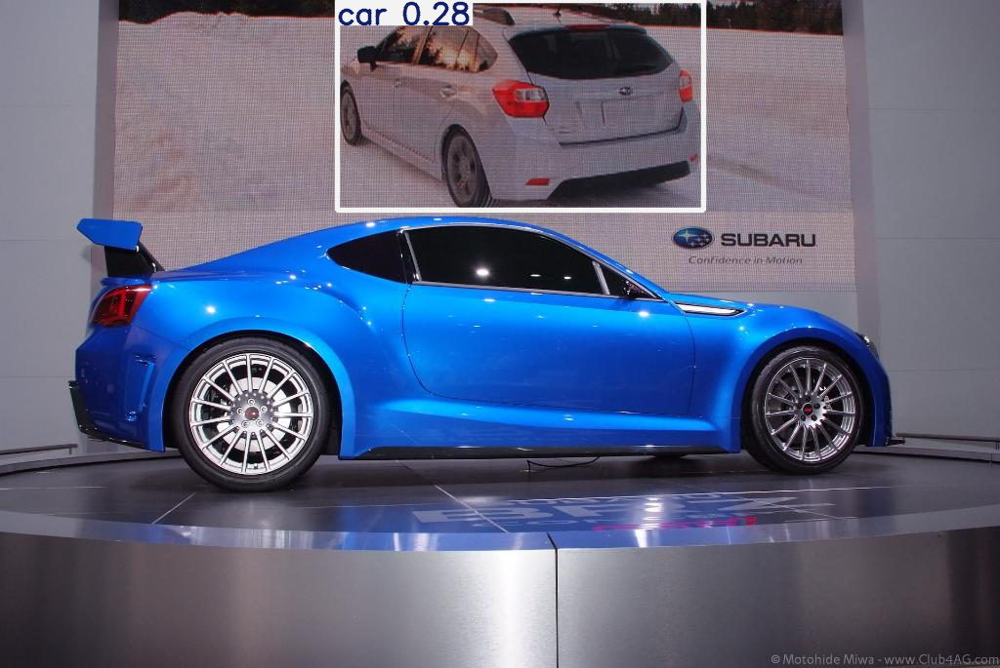

In [234]:
# Path to the image you want to test
image_path = "/kaggle/working/filtered_sh17_dataset_use/673d8d5942304a3c11bd08b2.jpg"

# Run the inference
results = model.predict(source=image_path)

# Display results
results[0].show()  # This will display the image with detected objects



image 1/1 /kaggle/working/images/000000488977.jpg: 320x416 1 person, 1 Gloves, 62.9ms
Speed: 1.9ms preprocess, 62.9ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 416)


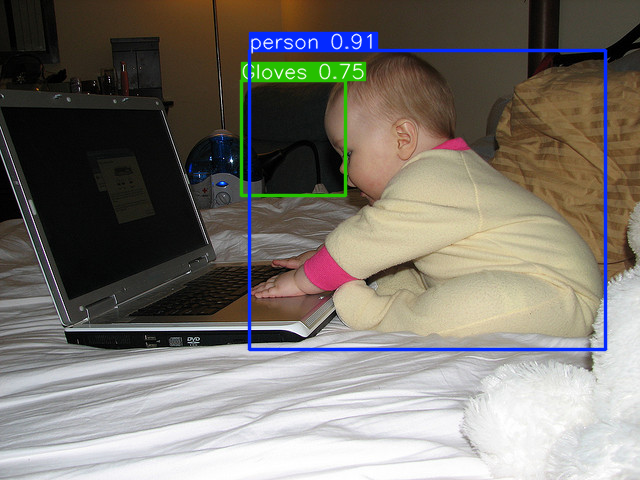

In [267]:
# Path to the image you want to test
image_path = "/kaggle/working/images/000000488977.jpg"

# Run the inference
results = model.predict(source=image_path)

# Display results
results[0].show()  # This will display the image with detected objects



image 1/1 /kaggle/working/processed_images/673d8d5942304a3c11bd0840.jpg: 320x416 1 person, 96.8ms
Speed: 2.2ms preprocess, 96.8ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 416)


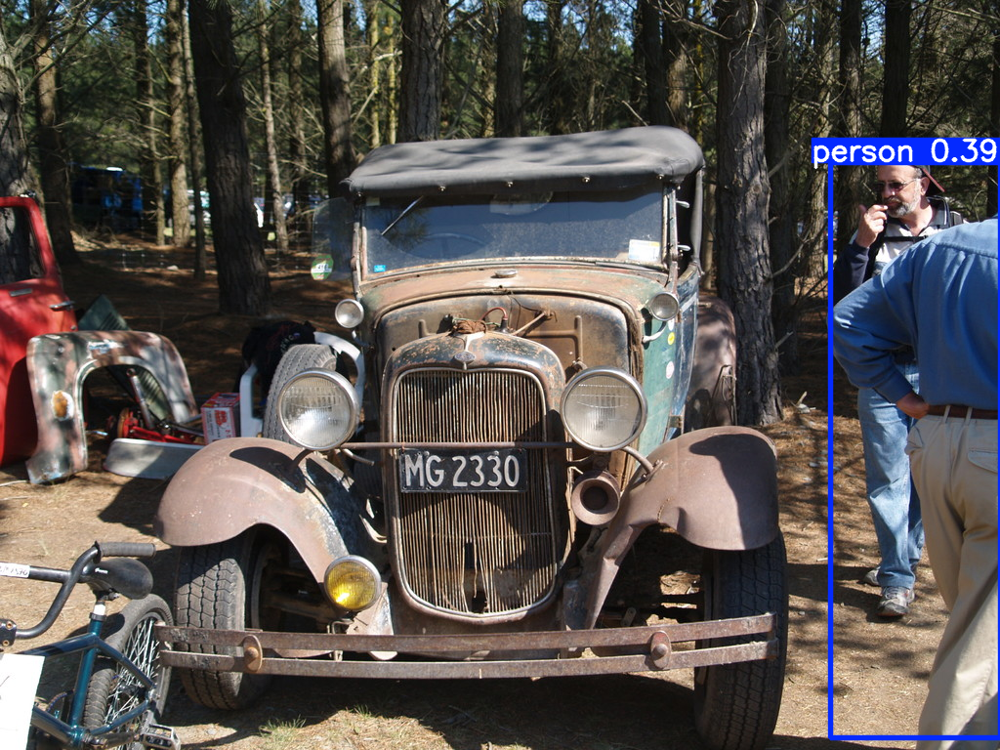

In [235]:
# Path to the image you want to test
image_path = "/kaggle/working/processed_images/673d8d5942304a3c11bd0840.jpg"

# Run the inference
results = model.predict(source=image_path)

# Display results
results[0].show()  # This will display the image with detected objects



image 1/1 /kaggle/working/processed_images/673d8d5942304a3c11bd083e.jpg: 288x416 1 Gloves, 67.3ms
Speed: 2.0ms preprocess, 67.3ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 416)


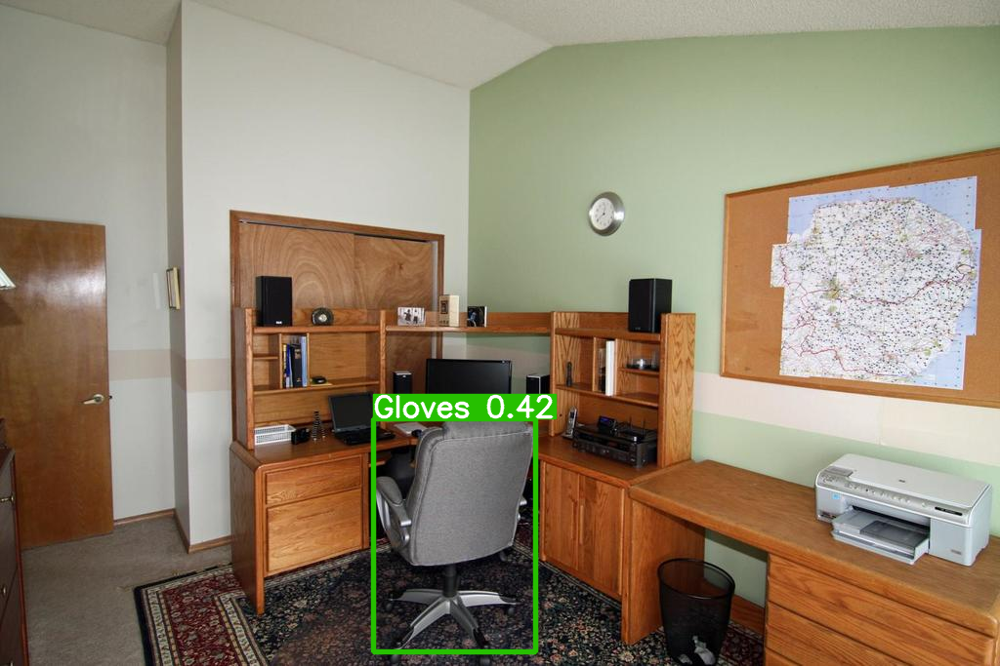

In [236]:
# Path to the image you want to test
image_path = "/kaggle/working/processed_images/673d8d5942304a3c11bd083e.jpg"

# Run the inference
results = model.predict(source=image_path)

# Display results
results[0].show()  # This will display the image with detected objects



image 1/1 /kaggle/working/images/000000208517.jpg: 416x288 6 persons, 94.2ms
Speed: 2.3ms preprocess, 94.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 288)


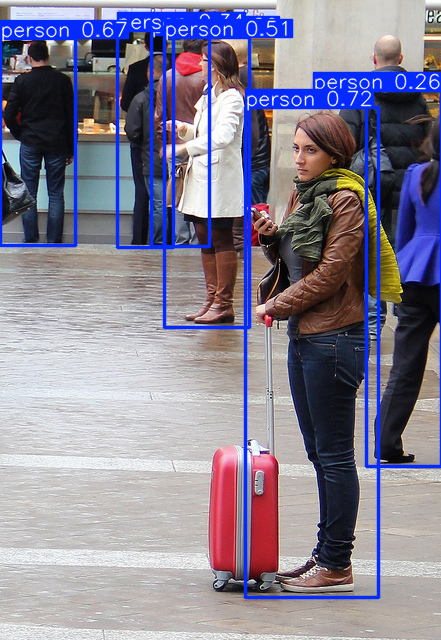

In [251]:
# Path to the image you want to test
image_path = '/kaggle/working/images/000000208517.jpg'

# Run the inference
results = model.predict(source=image_path)

# Display results
results[0].show()  # This will display the image with detected objects



image 1/1 /kaggle/working/filtered_sh17_dataset_use/673d8d5942304a3c11bd0a12.jpg: 352x416 1 person, 4 cars, 1 dog, 102.4ms
Speed: 2.2ms preprocess, 102.4ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 416)


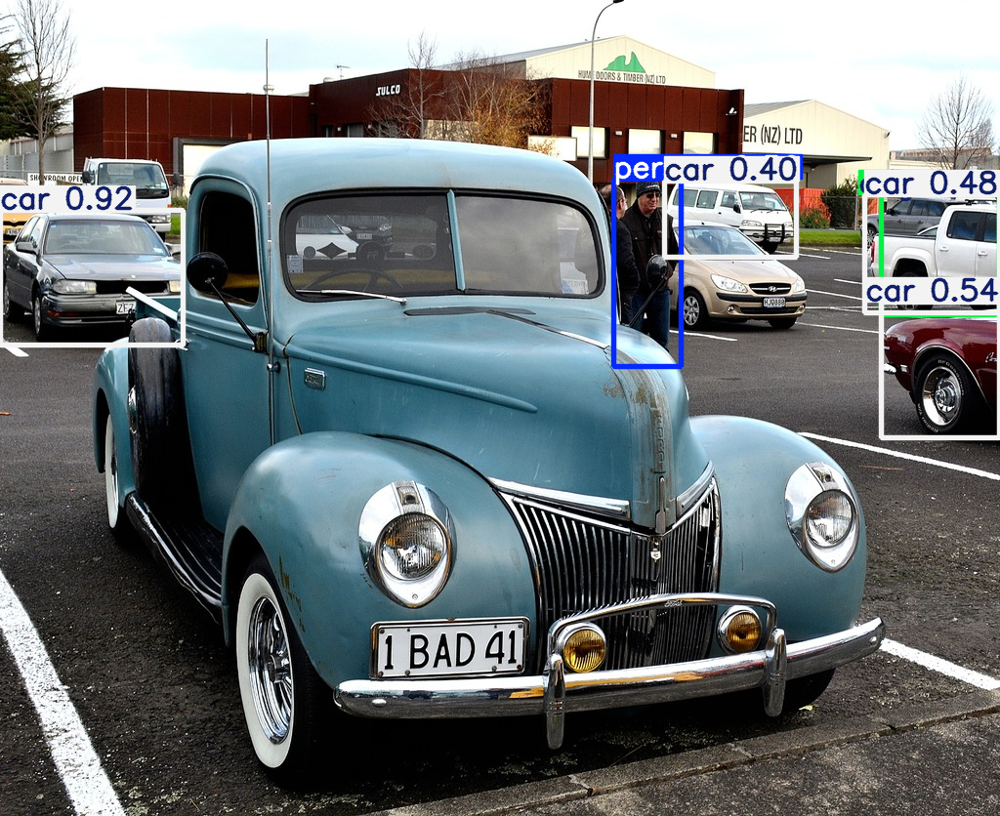

In [239]:
# Path to the image you want to test
image_path = "/kaggle/working/filtered_sh17_dataset_use/673d8d5942304a3c11bd0a12.jpg"

# Run the inference
results = model.predict(source=image_path)

# Display results
results[0].show()  # This will display the image with detected objects



image 1/1 /kaggle/working/images/000000000764.jpg: 288x416 11 persons, 62.6ms
Speed: 1.7ms preprocess, 62.6ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 416)


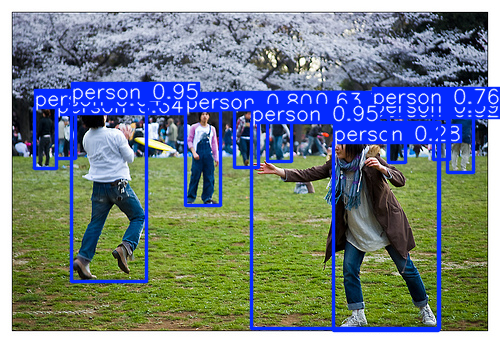

In [242]:
# Path to the image you want to test
image_path = '/kaggle/working/images/000000000764.jpg'

# Run the inference
results = model.predict(source=image_path)

# Display results
results[0].show()  # This will display the image with detected objects



image 1/1 /kaggle/working/images/000000195829.jpg: 288x416 4 persons, 66.8ms
Speed: 1.7ms preprocess, 66.8ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 416)


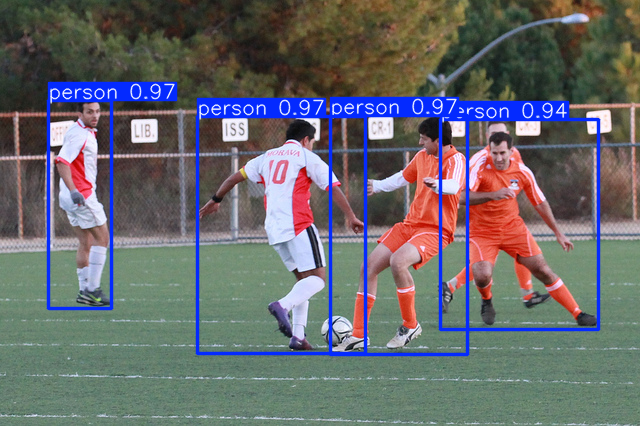

In [253]:
# Path to the image you want to test
image_path = "/kaggle/working/images/000000195829.jpg"

# Run the inference
results = model.predict(source=image_path)

# Display results
results[0].show()  # This will display the image with detected objects



image 1/1 /kaggle/working/images/000000190081.jpg: 416x256 1 person, 1 Gloves, 85.9ms
Speed: 1.6ms preprocess, 85.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 256)


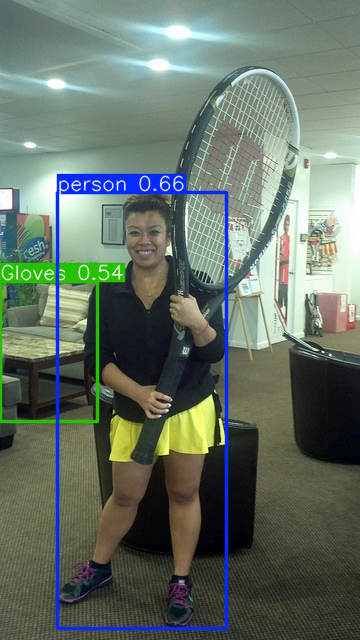

In [256]:
# Path to the image you want to test
image_path = "/kaggle/working/images/000000190081.jpg"

# Run the inference
results = model.predict(source=image_path)

# Display results
results[0].show()  # This will display the image with detected objects



image 1/1 /kaggle/working/images/000000498400.jpg: 288x416 8 persons, 1 car, 5 dogs, 59.9ms
Speed: 1.8ms preprocess, 59.9ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 416)


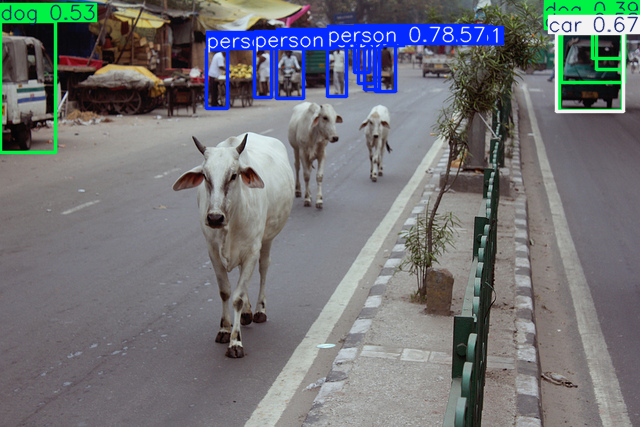

In [263]:
# Path to the image you want to test
image_path = "/kaggle/working/images/000000498400.jpg"

# Run the inference
results = model.predict(source=image_path)

# Display results
results[0].show()  # This will display the image with detected objects
